<a href="https://colab.research.google.com/github/alexandre-cameron-borges/duda_cohortscore/blob/main/data_and_finetuning_cohort.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **PROJET DUDA COHORTSCORE**

---



# 1 - Partie Analyse exploratoire

Setup

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

Mounted at /content/drive


Import du dataset contenant au minimum 200 000 lignes, avec une diversité de données numériques, catégorielles et temporelles

In [ ]:
# Configurer l’API Kaggle
!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/credentials/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Télécharger & dézipper les jeux Kaggle
!kaggle datasets download -d yasserh/instacart-online-grocery-basket-analysis-dataset \
    -p /content/drive/MyDrive/data/raw --unzip

In [ ]:
base_path = "/content/drive/MyDrive/data/raw/instacart-online-grocery-basket-analysis-dataset"

orders = pd.read_csv(f"{base_path}/orders.csv")
products = pd.read_csv(f"{base_path}/products_with_prices.csv")
aisles = pd.read_csv(f"{base_path}/aisles.csv")
order_products_prior = pd.read_csv(f"{base_path}/order_products__prior.csv")
order_products_train = pd.read_csv(f"{base_path}/order_products__train.csv")


Decouverte exploratoire des données

orders.csv — consists of order details placed by any user — shape: (3421083, 7)


*   Order_id : Unique for every order
*   User_id : Unique for every user
*   Eval_set : ( prior / train / test)
*   Order_number : ith order placed by user
*   Order_dow : Day of week
*   Order_hour_of_day : Time of day in hr
*   Days_since_prior_order : difference in days between 2 orders

In [ ]:
print("ORDERS:")
display(orders.head())
print(orders.shape)

print("PRODUCTS:")
display(products.head())
print(products.shape)

print("AISLES:")
display(aisles.head())
print(aisles.shape)


ORDERS:


,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,prior,1,2,8,NaN
1,2398795,1,prior,2,3,7,15.0
2,473747,1,prior,3,3,12,21.0
3,2254736,1,prior,4,4,7,29.0
4,431534,1,prior,5,4,15,28.0


(3421083, 7)
PRODUCTS:


,product_id,product_name,aisle_id,department_id,price
0,1,Chocolate Sandwich Cookies,61,19,€4.38
1,10,Sparkling Orange Juice & Prickly Pear Beverage,115,7,€2.25
2,100,Peanut Butter & Strawberry Jam Sandwich,38,1,€2.97
3,1000,Apricots,18,10,€3.15
4,10000,Refresher Strawberry Lemonade,64,7,€2.74


(49688, 5)
AISLES:


,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation


(134, 2)


Merge

In [ ]:
order_products_all = pd.concat([order_products_prior, order_products_train], ignore_index=True)
order_products_all.sort_values(by=["order_id", "add_to_cart_order"], inplace=True)
print("OPA:")
display(order_products_all.head())
print(order_products_all.shape)

OPA:


,order_id,product_id,add_to_cart_order,reordered
32434489,1,49302,1,1
32434490,1,11109,2,1
32434491,1,10246,3,0
32434492,1,49683,4,0
32434493,1,43633,5,1


(33819106, 4)


Nettoyage des données

In [ ]:
nan_counts = orders.isna().sum()
print("NaN orders :\n", nan_counts)

dup_total = orders.duplicated().sum()
print(f"Nombre de lignes dupliquées orders : {dup_total}")

nan_counts2 = products.isna().sum()
print("NaN products :\n", nan_counts2)

dup_total2 = products.duplicated().sum()
print(f"Nombre de lignes dupliquées products : {dup_total2}")

nan_counts3 = aisles.isna().sum()
print("NaN aisles :\n", nan_counts3)

dup_total3 = aisles.duplicated().sum()
print(f"Nombre de lignes dupliquées aisles : {dup_total3}")

nan_counts4 = order_products_all.isna().sum()
print("NaN opa :\n", nan_counts4)

dup_total4 = order_products_all.duplicated().sum()
print(f"Nombre de lignes dupliquées opa : {dup_total4}")

NaN orders :
 order_id                       0
user_id                        0
eval_set                       0
order_number                   0
order_dow                      0
order_hour_of_day              0
days_since_prior_order    206209
dtype: int64
Nombre de lignes dupliquées orders : 0
NaN products :
 product_id       0
product_name     0
aisle_id         0
department_id    0
price            0
dtype: int64
Nombre de lignes dupliquées products : 0
NaN aisles :
 aisle_id    0
aisle       0
dtype: int64
Nombre de lignes dupliquées aisles : 0
NaN opa :
 order_id             0
product_id           0
add_to_cart_order    0
reordered            0
dtype: int64
Nombre de lignes dupliquées opa : 0


In [ ]:
# Gérer les NaN de la 1ʳᵉ commande → 0 jour avant
orders["days_since_prior_order"] = orders["days_since_prior_order"].fillna(0)

Création des variables supplémentaires & 7 analyses

In [ ]:
## 2 Best sellers aisles & products (with % of repeat)

# Merge des produits avec les infos produits (nom, aisle, etc.)
merged = order_products_all.merge(products, on='product_id', how='left')

# Merge avec la table des rayons (aisles)
merged = merged.merge(aisles, on='aisle_id', how='left')

display(merged.head(20))
print(merged.shape)



,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,price,aisle
0,1,49302,1,1,Bulgarian Yogurt,120,16,€3.39,yogurt
1,1,11109,2,1,Organic 4% Milk Fat Whole Milk Cottage Cheese,108,16,€4.34,other creams cheeses
2,1,10246,3,0,Organic Celery Hearts,83,4,€4.64,fresh vegetables
3,1,49683,4,0,Cucumber Kirby,83,4,€3.11,fresh vegetables
4,1,43633,5,1,Lightly Smoked Sardines in Olive Oil,95,15,€7.45,canned meat seafood
5,1,13176,6,0,Bag of Organic Bananas,24,4,€0.90,fresh fruits
6,1,47209,7,0,Organic Hass Avocado,24,4,€3.84,fresh fruits
7,1,22035,8,1,Organic Whole String Cheese,21,16,€4.66,packaged cheese
8,2,33120,1,1,Organic Egg Whites,86,16,€4.52,eggs
9,2,28985,2,1,Michigan Organic Kale,83,4,€1.99,fresh vegetables


(33819106, 9)


In [ ]:
# Nettoyage de la colonne prix
merged["price"] = merged["price"].replace('[€]', '', regex=True).astype(float)
display(merged.head(20))

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,price,aisle
0,1,49302,1,1,Bulgarian Yogurt,120,16,3.39,yogurt
1,1,11109,2,1,Organic 4% Milk Fat Whole Milk Cottage Cheese,108,16,4.34,other creams cheeses
2,1,10246,3,0,Organic Celery Hearts,83,4,4.64,fresh vegetables
3,1,49683,4,0,Cucumber Kirby,83,4,3.11,fresh vegetables
4,1,43633,5,1,Lightly Smoked Sardines in Olive Oil,95,15,7.45,canned meat seafood
5,1,13176,6,0,Bag of Organic Bananas,24,4,0.90,fresh fruits
6,1,47209,7,0,Organic Hass Avocado,24,4,3.84,fresh fruits
7,1,22035,8,1,Organic Whole String Cheese,21,16,4.66,packaged cheese
8,2,33120,1,1,Organic Egg Whites,86,16,4.52,eggs
9,2,28985,2,1,Michigan Organic Kale,83,4,1.99,fresh vegetables


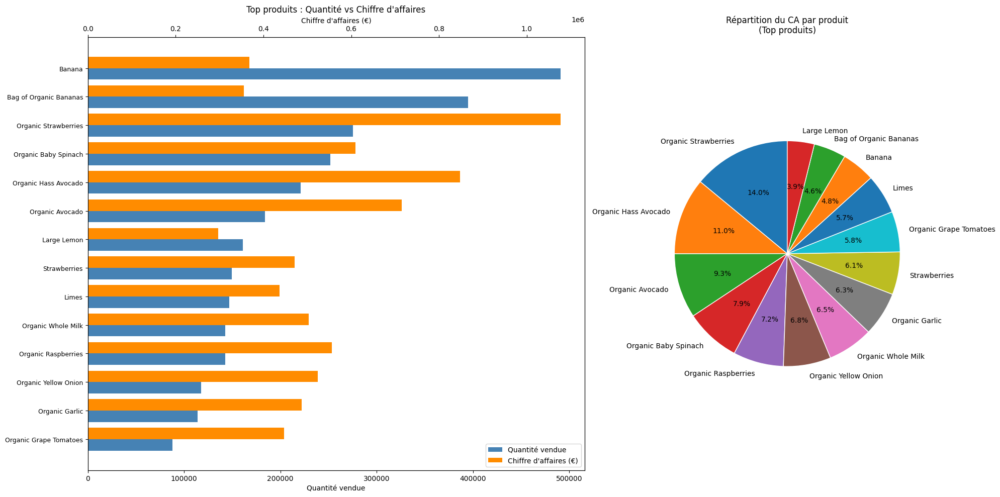

In [ ]:


# 2) Top 12 produits par quantité et CA
top_qty_prod = (
    merged
    .groupby('product_name')
    .size()
    .reset_index(name='total_qty')
    .nlargest(12, 'total_qty')
)
top_rev_prod = (
    merged
    .groupby('product_name')['price']
    .sum()
    .reset_index(name='total_rev')
    .nlargest(10, 'total_rev')
)

# 3) Union des produits
prods = pd.Index(top_qty_prod['product_name']).union(top_rev_prod['product_name'])

# 4) Recalcul des métriques sur cet ensemble
df_prod = (
    merged
    .groupby('product_name')
    .agg(
        total_qty=('order_id', 'count'),
        total_rev=('price',   'sum')
    )
    .loc[prods]
    .sort_values('total_qty', ascending=True)
)

# 5) Figure en deux panneaux
fig, (ax1, ax2) = plt.subplots(
    1, 2,
    figsize=(20, 10),
    gridspec_kw={'width_ratios': [2, 1]}
)

y = list(range(len(df_prod)))

# — Panel 1 : barres dual-axe Quantité vs CA
bars1 = ax1.barh(
    [i - 0.2 for i in y],
    df_prod['total_qty'],
    height=0.4,
    color='steelblue',
    label='Quantité vendue'
)
ax1.set_yticks(y)
ax1.set_yticklabels(df_prod.index, fontsize=9)
ax1.set_xlabel('Quantité vendue')

ax1_tw = ax1.twiny()
bars2 = ax1_tw.barh(
    [i + 0.2 for i in y],
    df_prod['total_rev'],
    height=0.4,
    color='darkorange',
    label="Chiffre d'affaires (€)"
)
ax1_tw.set_xlabel("Chiffre d'affaires (€)")

# Légende combinée
handles = [bars1, bars2]
labels  = [h.get_label() for h in handles]
ax1.legend(handles, labels, loc='lower right')

ax1.set_title("Top produits : Quantité vs Chiffre d'affaires")

# — Panel 2 : camembert du CA

ordered = df_prod['total_rev'].sort_values(ascending=False)
ax2.pie(
    ordered.values,
    autopct='%1.1f%%',
    labels=ordered.index,
    startangle=90,
    wedgeprops={'edgecolor': 'white'}
)


ax2.axis('equal')
ax2.set_title("Répartition du CA par produit\n(Top produits)")

plt.tight_layout()
plt.show()


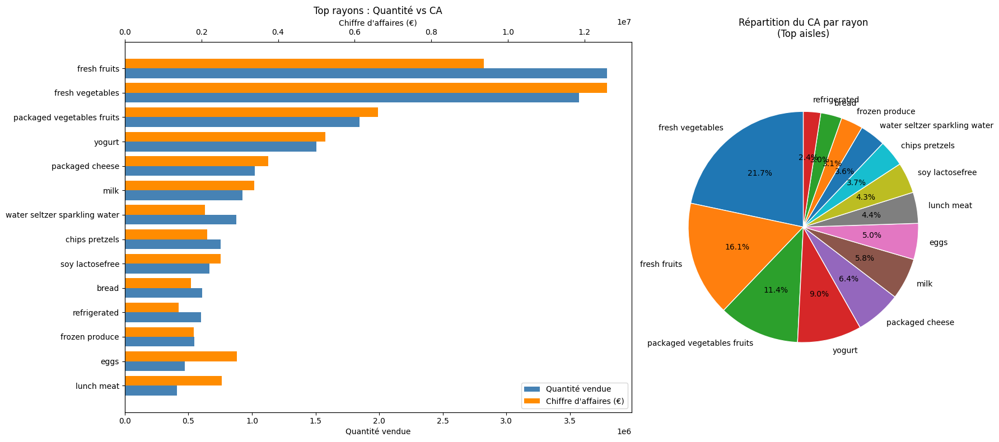

In [ ]:


# 2) Top 12 par quantité et par CA
top_qty_aisle = (
    merged
    .groupby('aisle')
    .size()
    .reset_index(name='total_qty')
    .nlargest(12, 'total_qty')
)
top_rev_aisle = (
    merged
    .groupby('aisle')['price']
    .sum()
    .reset_index(name='total_rev')
    .nlargest(10, 'total_rev')
)

# 3) Union des rayons et recalcul des métriques
aisles = pd.Index(top_qty_aisle['aisle']).union(top_rev_aisle['aisle'])
df_aisle = (
    merged
    .groupby('aisle')
    .agg(
        total_qty=('order_id', 'count'),
        total_rev=('price',   'sum')
    )
    .loc[aisles]
    .sort_values('total_qty', ascending=True)
)

# 4) Figure à deux panneaux
fig, (ax1, ax2) = plt.subplots(
    1, 2,
    figsize=(18, 8),
    gridspec_kw={'width_ratios': [2, 1]}
)

y = list(range(len(df_aisle)))

# — Panel 1 : dual-axe Quantité vs CA
bars1 = ax1.barh(
    [i - 0.2 for i in y],
    df_aisle['total_qty'],
    height=0.4,
    color='steelblue',
    label='Quantité vendue'
)
ax1.set_yticks(y)
ax1.set_yticklabels(df_aisle.index)
ax1.set_xlabel('Quantité vendue')

ax2b = ax1.twiny()
bars2 = ax2b.barh(
    [i + 0.2 for i in y],
    df_aisle['total_rev'],
    height=0.4,
    color='darkorange',
    label="Chiffre d'affaires (€)"
)
ax2b.set_xlabel("Chiffre d'affaires (€)")

handles = [bars1, bars2]
labels  = [h.get_label() for h in handles]
ax1.legend(handles, labels, loc='lower right')

ax1.set_title("Top rayons : Quantité vs CA")

# — Panel 2 : pie chart du CA
orderedaisles = df_aisle['total_rev'].sort_values(ascending=False)
ax2.pie(
    orderedaisles.values,
    labels=orderedaisles.index,
    autopct='%1.1f%%',
    startangle=90,
    wedgeprops={'edgecolor': 'white'}
)
ax2.axis('equal')  # pour un cercle parfait
ax2.set_title("Répartition du CA par rayon\n(Top aisles)")

plt.tight_layout()
plt.show()


In [ ]:
# Fusion de orders avec order_products_all
full_data = merged.merge(orders, on='order_id', how='left')

# 2 Best moments (day and hour)

top_hours = full_data.groupby('order_hour_of_day')['product_id'].count()
top_days = full_data.groupby('order_dow')['product_id'].count()


# Matrice Jour x Heure (nombre de produits commandés)
sales_matrix = (
    full_data
    .groupby(["order_dow", "order_hour_of_day"])
    .size()
    .unstack(fill_value=0)
)

day_names = ['Sun','Mon','Tue','Wed','Thu','Fri','Sat']
sales_matrix.index = day_names

# Remplacer l’index de top_days par les noms
top_days.index = [day_names[d] for d in top_days.index]

sales_thousands = sales_matrix / 1000

<ipython-input-75-002ccb6b929b>:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-75-002ccb6b929b>:23: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




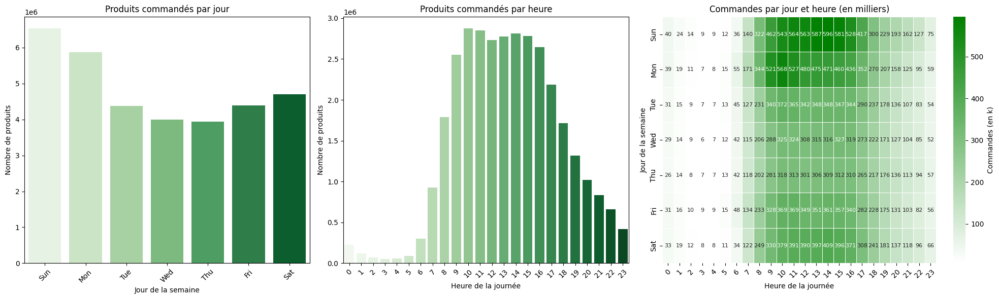

In [ ]:
from matplotlib.colors import LinearSegmentedColormap

# Création de la figure avec 3 sous-graphes
fig, axes = plt.subplots(
    1, 3,
    figsize=(20, 6),
    gridspec_kw={'width_ratios': [1, 1, 1.2]}
)

# 1) Histogramme : produits commandés par jour
sns.barplot(
    x=top_days.index,
    y=top_days.values,
    palette='Greens',
    ax=axes[0]
)
axes[0].set_title("Produits commandés par jour")
axes[0].set_xlabel("Jour de la semaine")
axes[0].set_ylabel("Nombre de produits")
axes[0].tick_params(axis='x', rotation=45)

# 2) Histogramme : produits commandés par heure
sns.barplot(
    x=top_hours.index,
    y=top_hours.values,
    palette='Greens',
    ax=axes[1]
)
axes[1].set_title("Produits commandés par heure")
axes[1].set_xlabel("Heure de la journée")
axes[1].set_ylabel("Nombre de produits")
axes[1].tick_params(axis='x', rotation=45)

# 3) Heatmap : commandes jour x heure en milliers
cmap_wg = LinearSegmentedColormap.from_list('RedGreen', ['white','green'])
sns.heatmap(
    sales_thousands,
    cmap=cmap_wg,
    annot=True,
    fmt='.0f',
    annot_kws={'fontsize':8},
    cbar_kws={'label': 'Commandes (en k)'},
    linewidths=0.5,
    linecolor='white',
    ax=axes[2]
)
axes[2].set_title("Commandes par jour et heure (en milliers)")
axes[2].set_xlabel("Heure de la journée")
axes[2].set_ylabel("Jour de la semaine")
axes[2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


In [ ]:
# 3 RFM Cluster





In [ ]:
# 1. Copie de full_data
df = full_data.copy()

# 2. Gérer les NaN de la 1ʳᵉ commande → 0 jour avant
df["days_since_prior_order"] = df["days_since_prior_order"].fillna(0)

# 3. Ordonner pour chaque utilisateur
df = df.sort_values(["user_id", "order_number"])

# 4. Cumuler les jours jusqu’à chaque commande
df["days_cumul"] = df.groupby("user_id")["days_since_prior_order"].cumsum()

# 5. Extraire la récence : max du cumul = jours depuis la dernière commande
last_days = (
    df
    .groupby("user_id")["days_cumul"]
    .max()
    .reset_index(name="Recency")
)

# 6. Calculer Frequency (nombre total de commandes)
frequency = (
    df
    .groupby("user_id")["order_number"]
    .nunique()
    .reset_index(name="Frequency")
)

# 7. Calculer Monetary (€ total dépensé)
#    (adaptez si vous avez un champ `price * quantity`)
monetary = (
    df
    .groupby("user_id")["price"]
    .sum()
    .reset_index(name="Monetary")
)

# 8. Merge final RFM
rfm = last_days.merge(frequency, on="user_id") \
               .merge(monetary, on="user_id")

# 9. Aperçu
print(rfm.head())
print(rfm.info())
print(rfm.describe())


   user_id  Recency  Frequency  Monetary
0        1   1248.0         11    235.86
1        2   3836.0         15    849.62
2        3    896.0         12    303.20
3        4    215.0          5     57.65
4        5    431.0          5    175.97
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206209 entries, 0 to 206208
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   user_id    206209 non-null  int64  
 1   Recency    206209 non-null  float64
 2   Frequency  206209 non-null  int64  
 3   Monetary   206209 non-null  float64
dtypes: float64(2), int64(2)
memory usage: 6.3 MB
None
             user_id        Recency      Frequency       Monetary
count  206209.000000  206209.000000  206209.000000  206209.000000
mean   103105.000000    1749.244703      16.226658     605.655212
std     59527.555167    1650.993348      16.662238     758.289973
min         1.000000       0.000000       3.000000       3.030000
25%     51553

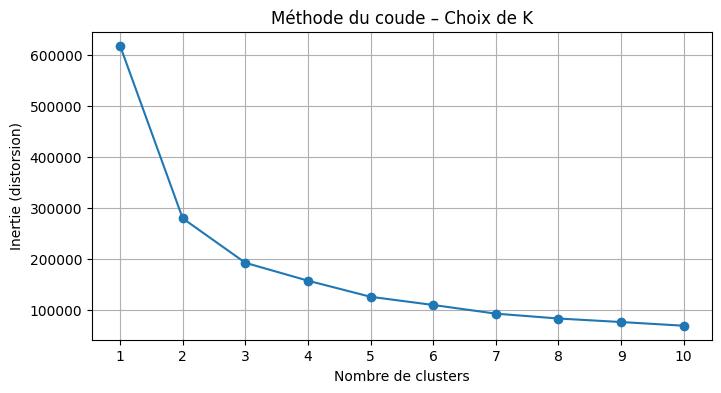

In [ ]:
# CLUSTERING

from sklearn.preprocessing import StandardScaler

# Choix : soit RFM bruts, soit scores (plus simple à interpréter)
X = rfm[["Recency", "Frequency", "Monetary"]].copy()

# Standardisation
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

inertia = []
K_range = range(1, 11)

for k in K_range:
    model = KMeans(n_clusters=k, random_state=42)
    model.fit(X_scaled)
    inertia.append(model.inertia_)

# Courbe du coude
plt.figure(figsize=(8, 4))
plt.plot(K_range, inertia, marker='o')
plt.title("Méthode du coude – Choix de K")
plt.xlabel("Nombre de clusters")
plt.ylabel("Inertie (distorsion)")
plt.xticks(K_range)
plt.grid(True)
plt.show()



In [ ]:
# Choix du K où la courbe commence à "plier" : souvent entre 3 et 6.
k = 6
kmeans = KMeans(n_clusters=k, random_state=42)
rfm["Cluster"] = kmeans.fit_predict(X_scaled)


In [ ]:
# Moyenne des variables RFM par cluster
cluster_summary = (
    rfm.groupby("Cluster")[["Recency", "Frequency", "Monetary"]]
    .mean()
    .round(1)
    .sort_values("Monetary", ascending=False)
)

# 1. Calculer le nombre de clients par cluster
cluster_counts = rfm.groupby("Cluster").size().rename("Count")

# 2. Joindre ce décompte à votre summary existant
cluster_summary_with_count = (
    cluster_summary
    .join(cluster_counts)                   # ajoute la colonne Count
    .sort_values("Monetary", ascending=False)  # tri facultatif
)

# 3. Afficher le résultat
display(cluster_summary_with_count)



,Recency,Frequency,Monetary,Count
Cluster,,,,
5,6185.7,70.7,4102.5,3778
1,6101.8,33.3,2157.6,8755
2,2556.8,60.6,1635.5,10686
3,3574.7,22.4,1048.2,25684
0,1786.2,15.9,505.9,55885
4,640.5,6.7,175.8,101421


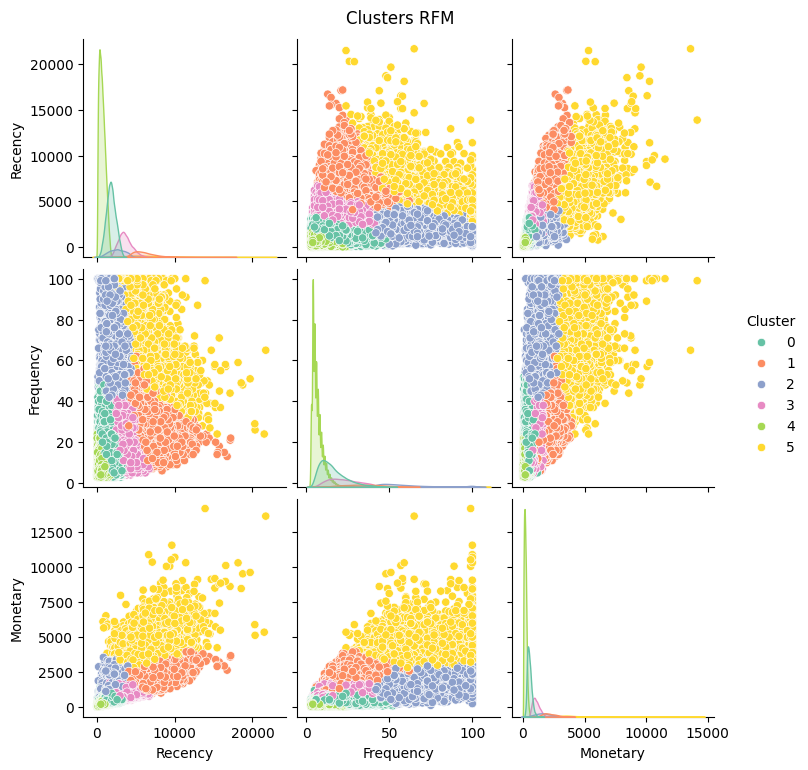

In [ ]:

sns.pairplot(
    rfm,
    vars=["Recency", "Frequency", "Monetary"],
    hue="Cluster",
    palette="Set2"
)
plt.suptitle("Clusters RFM", y=1.02)
plt.show()


In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
import plotly.graph_objects as go

# 1. Préprocessing log-scale
rfm = rfm.copy()
rfm["Recency_log"]  = np.log1p(rfm["Recency"])
rfm["Monetary_log"] = np.log1p(rfm["Monetary"])

# 2. Centroides
centroids = (
    rfm.groupby("Cluster")[["Recency_log","Frequency","Monetary_log"]]
       .median()
       .reset_index()
)

# 3. Scatter interactif
fig = px.scatter_3d(
    rfm,
    x="Recency_log", y="Frequency", z="Monetary_log",
    color="Cluster",
    symbol="Cluster",
    size="Frequency",
    size_max=10,
    opacity=0.7,
    hover_data=["Recency","Monetary"]
)


# 4. Ajustements de style
fig.update_layout(
    title="Clusters RFM – Visualisation 3D (Interactif)",
    scene=dict(
        xaxis_title="Recency",
        yaxis_title="Frequency",
        zaxis_title="Monetary",
        aspectmode='cube'
    ),
    margin=dict(l=0,r=0,b=0,t=30),
    legend_title_text='Cluster'
)

fig.show()


Visualisation avec filtres dynamiques sur l'app.py streamlit

# 2 - Partie text mining

Prétraitement du texte (nettoyage, tokenisation, suppression des stopwords, etc.)

WordCloud